<a href="https://colab.research.google.com/github/Zauqyaraff/PZSIB-AML/blob/main/Topic11_12_HW_Zauqy_Affan_Raff.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Welcome to Day 11 - Homework!

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import median

In [ ]:
#df = pd.read_csv('housepricesdata.csv')
url = 'https://raw.githubusercontent.com/Zauqyaraff/PZSIB-AML/main/housepricesdata.csv'
df = pd.read_csv(url)

Penjelasan:
1. Unit_Name: Nama Unit Apartmen
2. No_Rooms: Jumlah bedrooms
3. Bathroom: Jumlah kamar mandi
4. Locality: Daerah
5. Region: Kota/Kabupaten
6. Longitude dan Latitude: letak geografis
7. Furnished: 1 jika fully furnished, 0 jika non-furnished
8. Area: Luas
9. Tower: Lokasi Tower
10. Total_Facilities: Jumlah Total Fasilitas
11. Currency: Mata Uang (USD/IDR)
12. Annual_Price: Harga sewa tahunan (sesuai mata uang)

### Soal:

1. Perhatikan kolom 'Currency' dan 'Annual_Price'. Buatlah kolom baru bernama `CleanedPrice`. Kolom ini dibuat berdasarkan informasi dari 'Annual_Price' dan 'Currency', sehingga harga sewa tahunan di `CleanedPrice` memiliki mata uang yang sama, yaitu IDR (Rupiah). Gunakan Asumsi 1 USD = 15 000 IDR.
2. Analisalah kolom 'No_Rooms' dan 'CleanedPrice'. Apakah ada kejanggalan? Jika ya, nyatakanlah apa yang membuat data-data tersebut janggal. Kemudian, perbaikilah (jika hal tersebut dapat dilakukan). Jika Anda tidak memilih untuk memperbaikinya, maka apa yang sebaiknya dilakukan pada baris-baris tersebut? 
3. Apartemen di Kota/Kabupaten mana yang memiliki rata-rata harga paling tinggi? Buatlah visualisasi untuk mendukung klaim Anda. 
4. Analisalah kolom 'Longitude' dan 'Latitude'. Apakah ada kejanggalan? Jika ya, nyatakanlah apa yang membuat data-data tersebut janggal. Ada kejanggalan yang ***bisa dijelaskan***, sehingga data tersebut meskipun janggal tapi sah-sah saja, dan ada pula kejanggalan yang ***salah***, sehingga data tersebut harus diperbaiki. Kejanggalan tipe apa yang muncul di kolom 'Longitude' dan 'Latitude'? Bila kejanggalan tersebut bisa dijelaskan, maka jelaskanlah. Bila kejanggalan tersebut merupakan sebuah kesalahan, maka coba perbaikilah. 

### Jawaban

In [ ]:
#### Display the whole dataframe #####

# display all the  rows
pd.set_option('display.max_rows', None)

# display all the  columns
pd.set_option('display.max_columns', None)

# set width  - 100
pd.set_option('display.width', 120)

# set column header -  left
pd.set_option('display.colheader_justify', 'left')

# set precision - 5
pd.set_option('display.precision', 5)

# display the dataframe
print(df)

     Unit_Name                                           No_Rooms  Bathroom Locality                 Region            \
0             Taman Sari Semanggi Apartment 1BR Tower A  1         1                        Semanggi  Jakarta Selatan   
1           Puri Park View Apartment 2BR Semi Furnished  2         1                     Kebon Jeruk    Jakarta Barat   
2              Metro Park Residence 2BR Fully Furnished  2         1                          Kedoya    Jakarta Barat   
3        Pondok Indah Golf Apartment 2BR View Golf Area  2         2                    Pondok Indah  Jakarta Selatan   
4                     Season City Apartment 2BR Tower C  2         1                          Grogol    Jakarta Barat   
5      Green Pramuka City Apartment 2BR Fully Furnished  2         1                   Cempaka Putih    Jakarta Pusat   
6      Springhill Terrace Residence 2BR Fully Furnished  2         1                       Kemayoran    Jakarta Pusat   
7          Kemang Village Apartm

In [ ]:
df.head()

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price
0,Taman Sari Semanggi Apartment 1BR Tower A,1,1,Semanggi,Jakarta Selatan,106.81916,-6.22660,1,43.0,Tower A,23,IDR,96000000
1,Puri Park View Apartment 2BR Semi Furnished,2,1,Kebon Jeruk,Jakarta Barat,106.75606,-6.19208,0,35.0,Tower CB,19,IDR,30000000
2,Metro Park Residence 2BR Fully Furnished,2,1,Kedoya,Jakarta Barat,106.75765,-6.18642,1,53.0,Tower Milan,22,IDR,70000000
3,Pondok Indah Golf Apartment 2BR View Golf Area,2,2,Pondok Indah,Jakarta Selatan,106.78460,-6.27264,1,85.0,Tower -,24,IDR,576000000
4,Season City Apartment 2BR Tower C,2,1,Grogol,Jakarta Barat,106.79606,-6.15365,0,48.0,Tower C,15,IDR,32000000


In [ ]:
df.tail()

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price
5298,Grand Centerpoint Apartment 2BR View pool,2,1,Pekayon,Bekasi,106.99340,-6.24340,1,36.0,Tower c,14,IDR,36000000
5299,Roseville SOHO & Suites Studio Fully Furnished,0,1,BSD City,Tangerang,106.66400,-6.29440,1,32.0,Tower East,16,IDR,60000000
5300,Setiabudi Residence 2BR Fully Furnished,2,1,Setiabudi,Jakarta Selatan,106.82933,-6.21654,1,83.0,Tower B,21,IDR,250000000
5301,Apartemen Semanggi 2BR Tower 1,2,1,Slipi,Jakarta Pusat,106.80174,-6.20230,1,68.0,Tower 1,24,IDR,108000000
5302,Signature Park Grande 2BR View City,2,1,MT Haryono,Jakarta Timur,106.86620,-6.24520,1,42.0,Tower TA,20,IDR,108000000


#### 1. Membuat kolom baru bernama CleanedPrice berdasarkan value dari kolom annual price dengan mengubahnya menjadi bentuk USD.

In [ ]:
df['CleanedPrice'] = np.where(df['Currency'] == 'USD', df['Annual_Price'] * 15000, df['Annual_Price'])
df.head(77)

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price,CleanedPrice
0,Taman Sari Semanggi Apartment 1BR Tower A,1,1,Semanggi,Jakarta Selatan,106.81916,-6.22660,1,43.0,Tower A,23,IDR,96000000,96000000
1,Puri Park View Apartment 2BR Semi Furnished,2,1,Kebon Jeruk,Jakarta Barat,106.75606,-6.19208,0,35.0,Tower CB,19,IDR,30000000,30000000
2,Metro Park Residence 2BR Fully Furnished,2,1,Kedoya,Jakarta Barat,106.75765,-6.18642,1,53.0,Tower Milan,22,IDR,70000000,70000000
3,Pondok Indah Golf Apartment 2BR View Golf Area,2,2,Pondok Indah,Jakarta Selatan,106.78460,-6.27264,1,85.0,Tower -,24,IDR,576000000,576000000
4,Season City Apartment 2BR Tower C,2,1,Grogol,Jakarta Barat,106.79606,-6.15365,0,48.0,Tower C,15,IDR,32000000,32000000
5,Green Pramuka City Apartment 2BR Fully Furnished,2,1,Cempaka Putih,Jakarta Pusat,106.87319,-6.18793,1,33.0,Tower Fagio,21,IDR,60000000,60000000
6,Springhill Terrace Residence 2BR Fully Furnished,2,1,Kemayoran,Jakarta Pusat,106.85011,-6.14907,1,58.0,Tower OAKWOOD,14,IDR,80000000,80000000
7,Kemang Village Apartment 3BR Fully Furnished,3,2,Kemang,Jakarta Selatan,106.81145,-6.25937,1,132.0,Tower Empire,22,IDR,240000000,240000000
8,Kalibata City Apartment 2BR Tower Gaharu,2,1,Pancoran,Jakarta Selatan,106.85184,-6.25716,1,33.0,Tower Gaharu,20,IDR,45400000,45400000
9,Green Pramuka City Apartment 2BR Tower Penelope,2,1,Cempaka Putih,Jakarta Pusat,106.87319,-6.18793,0,33.0,Tower Penelope,17,IDR,33000000,33000000


In [ ]:
df.tail()

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price,CleanedPrice
5298,Grand Centerpoint Apartment 2BR View pool,2,1,Pekayon,Bekasi,106.99340,-6.24340,1,36.0,Tower c,14,IDR,36000000,36000000
5299,Roseville SOHO & Suites Studio Fully Furnished,0,1,BSD City,Tangerang,106.66400,-6.29440,1,32.0,Tower East,16,IDR,60000000,60000000
5300,Setiabudi Residence 2BR Fully Furnished,2,1,Setiabudi,Jakarta Selatan,106.82933,-6.21654,1,83.0,Tower B,21,IDR,250000000,250000000
5301,Apartemen Semanggi 2BR Tower 1,2,1,Slipi,Jakarta Pusat,106.80174,-6.20230,1,68.0,Tower 1,24,IDR,108000000,108000000
5302,Signature Park Grande 2BR View City,2,1,MT Haryono,Jakarta Timur,106.86620,-6.24520,1,42.0,Tower TA,20,IDR,108000000,108000000


#### 2. Analisalah kolom 'No_Rooms' dan 'CleanedPrice'. Apakah ada kejanggalan? Jika ya, nyatakanlah apa yang membuat data-data tersebut janggal. Kemudian, perbaikilah (jika hal tersebut dapat dilakukan). Jika Anda tidak memilih untuk memperbaikinya, maka apa yang sebaiknya dilakukan pada baris-baris tersebut?

Tidak ada kejanggalan, namun untuk No_Rooms sebaiknya diberi keterangan jika studio = 0 , 1 kamar tidur = 1, dst. Untuk kolom Cleaned Price sebaiknya hanya 2 angka dibelakang koma agar lebih rapi dan tertata.

In [ ]:
df.style.format({
    'CleanedPrice': '{:.0f}'.format,
})

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price,CleanedPrice
0,Taman Sari Semanggi Apartment 1BR Tower A,1,1,Semanggi,Jakarta Selatan,106.81916,-6.22660,1,43.00000,Tower A,23,IDR,96000000,96000000
1,Puri Park View Apartment 2BR Semi Furnished,2,1,Kebon Jeruk,Jakarta Barat,106.75606,-6.19208,0,35.00000,Tower CB,19,IDR,30000000,30000000
2,Metro Park Residence 2BR Fully Furnished,2,1,Kedoya,Jakarta Barat,106.75765,-6.18642,1,53.00000,Tower Milan,22,IDR,70000000,70000000
3,Pondok Indah Golf Apartment 2BR View Golf Area,2,2,Pondok Indah,Jakarta Selatan,106.78460,-6.27264,1,85.00000,Tower -,24,IDR,576000000,576000000
4,Season City Apartment 2BR Tower C,2,1,Grogol,Jakarta Barat,106.79606,-6.15365,0,48.00000,Tower C,15,IDR,32000000,32000000
5,Green Pramuka City Apartment 2BR Fully Furnished,2,1,Cempaka Putih,Jakarta Pusat,106.87319,-6.18793,1,33.00000,Tower Fagio,21,IDR,60000000,60000000
6,Springhill Terrace Residence 2BR Fully Furnished,2,1,Kemayoran,Jakarta Pusat,106.85011,-6.14907,1,58.00000,Tower OAKWOOD,14,IDR,80000000,80000000
7,Kemang Village Apartment 3BR Fully Furnished,3,2,Kemang,Jakarta Selatan,106.81145,-6.25937,1,132.00000,Tower Empire,22,IDR,240000000,240000000
8,Kalibata City Apartment 2BR Tower Gaharu,2,1,Pancoran,Jakarta Selatan,106.85184,-6.25716,1,33.00000,Tower Gaharu,20,IDR,45400000,45400000
9,Green Pramuka City Apartment 2BR Tower Penelope,2,1,Cempaka Putih,Jakarta Pusat,106.87319,-6.18793,0,33.00000,Tower Penelope,17,IDR,33000000,33000000


#### 3. Apartemen di Kota/Kabupaten mana yang memiliki rata-rata harga paling tinggi? Buatlah visualisasi untuk mendukung klaim Anda.

Kota Jakarta Selatan dengan rata-rata Cleaned Price diatas 8000 USD, dapat dilihat dari rata-rata visualisasi dibawah.

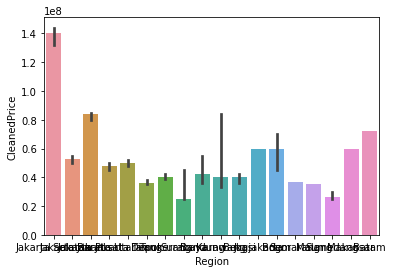

In [ ]:
# plotting horizontal bar plots with CleanedPrice and Region
# using the estimator parameter to set median as the estimate of central tendency
sns.barplot(x = df["Region"], y = df["CleanedPrice"], estimator = median)

# display
plt.show()

#### 4. Analisalah kolom 'Longitude' dan 'Latitude'. Apakah ada kejanggalan? Jika ya, nyatakanlah apa yang membuat data-data tersebut janggal. Ada kejanggalan yang bisa dijelaskan, sehingga data tersebut meskipun janggal tapi sah-sah saja, dan ada pula kejanggalan yang salah, sehingga data tersebut harus diperbaiki. Kejanggalan tipe apa yang muncul di kolom 'Longitude' dan 'Latitude'? Bila kejanggalan tersebut bisa dijelaskan, maka jelaskanlah. Bila kejanggalan tersebut merupakan sebuah kesalahan, maka coba perbaikilah.

Tidak ada kejanggalan yang merupakan kesalahan, namun lebih baik apabila hanya terdapat 3 angka decimal saja sehingga lebih rapih dan tertata pada kolom 'Longitude'dan 'Latitude'

In [ ]:
df.style.format({
    'Longitude': '{:.3f}'.format,
    'Latitude': '{:.3f}'.format,
})

,Unit_Name,No_Rooms,Bathroom,Locality,Region,Longitude,Latitude,Furnished,Area,Tower,Total_Facilities,Currency,Annual_Price,CleanedPrice
0,Taman Sari Semanggi Apartment 1BR Tower A,1,1,Semanggi,Jakarta Selatan,106.819,-6.227,1,43.00000,Tower A,23,IDR,96000000,96000000
1,Puri Park View Apartment 2BR Semi Furnished,2,1,Kebon Jeruk,Jakarta Barat,106.756,-6.192,0,35.00000,Tower CB,19,IDR,30000000,30000000
2,Metro Park Residence 2BR Fully Furnished,2,1,Kedoya,Jakarta Barat,106.758,-6.186,1,53.00000,Tower Milan,22,IDR,70000000,70000000
3,Pondok Indah Golf Apartment 2BR View Golf Area,2,2,Pondok Indah,Jakarta Selatan,106.785,-6.273,1,85.00000,Tower -,24,IDR,576000000,576000000
4,Season City Apartment 2BR Tower C,2,1,Grogol,Jakarta Barat,106.796,-6.154,0,48.00000,Tower C,15,IDR,32000000,32000000
5,Green Pramuka City Apartment 2BR Fully Furnished,2,1,Cempaka Putih,Jakarta Pusat,106.873,-6.188,1,33.00000,Tower Fagio,21,IDR,60000000,60000000
6,Springhill Terrace Residence 2BR Fully Furnished,2,1,Kemayoran,Jakarta Pusat,106.850,-6.149,1,58.00000,Tower OAKWOOD,14,IDR,80000000,80000000
7,Kemang Village Apartment 3BR Fully Furnished,3,2,Kemang,Jakarta Selatan,106.811,-6.259,1,132.00000,Tower Empire,22,IDR,240000000,240000000
8,Kalibata City Apartment 2BR Tower Gaharu,2,1,Pancoran,Jakarta Selatan,106.852,-6.257,1,33.00000,Tower Gaharu,20,IDR,45400000,45400000
9,Green Pramuka City Apartment 2BR Tower Penelope,2,1,Cempaka Putih,Jakarta Pusat,106.873,-6.188,0,33.00000,Tower Penelope,17,IDR,33000000,33000000
